# VIC - Final Project

**Students:** Zakariae EL ASRI & Nicolas GREVET\
**Date:** March 05, 2022

In [1]:
import os
import cv2 
import matplotlib.pyplot as plt
import numpy as np 
import math
import time
import pandas as pd

In [2]:
def createGUI():
    '''Function that creates the trackbar interface'''
    global screen, buttons
    cv2.createTrackbar("Low Hue", screen, 0,179, lambda x: updateValues(x, 0,0))
    cv2.createTrackbar("High Hue", screen, 179,179, lambda x: updateValues(x,1, 0))
    cv2.createTrackbar("Low Sat", screen, 0,255, lambda x: updateValues(x, 0,1))
    cv2.createTrackbar("High Sat", screen, 255,255, lambda x: updateValues(x, 1,1))
    cv2.createTrackbar("Low Val", screen, 0,255, lambda x: updateValues(x, 0,2))
    cv2.createTrackbar("High Val", screen, 255,255, lambda x: updateValues(x, 1,2))
    cv2.createTrackbar("Invert", screen, 0,1, doInvert)

def doInvert(val):
    '''Function that alters mask inversion'''
    global invert
    if val == 1:
        invert = True
    else:
        invert = False
    updateImg()

def updateValues(val, colrange, param):
    '''Function that updates the value ranges as set by the trackbars '''
    global col
    col[colrange][param] = val
    updateImg()

def updateImg():
    '''Displays image, masked with updated values'''
#     img_hsv = cv2.cvtColor(imS, cv2.COLOR_BGR2HSV)
    mask = cv2.inRange(img_hsv, tuple(col[0]),tuple(col[1]))
    if invert:
        mask = cv2.bitwise_not(mask)
    res = cv2.bitwise_and(imS,imS,mask=mask)
    cv2.imshow('Image', res)

## Dataset

The initial dataset that we wanted to work with was containing 492 images collected from real-world soccer games. The images have been extracted from cameras present in soccer stadiums for broadcasting the matches.

The images have been collected in such a way that they present a diverse collection of events that can occur in a game. These include various scenarios from both sides of the field.

Nevertheless, during the development of the project, many issues appear while processing the images from the whole dataset : dealing with images with many different features was one of them (almost all the images from different games have their own preprocessing regarding the good values for the masking step for example).

Regarding the deadline of the project, we decided to restrain our dataset only on one footage : the Poland vs. Portugal game at the Euro 2020 were Poland players are in white and Portugal players are in red.

In [3]:
images_dir = 'data/images/'
images_files = os.listdir(images_dir)
# images_files = images_files[1:]
print('\n',str(len(images_files)) + ' images in data/images/')

fileNames = []
for fileName in images_files:
    fileNames.append(images_dir+str(fileName))


 48 images in data/images/


##### Change the index value to change the selected image in the dataset :

In [20]:
idx = 0

for file_itr in range(idx,len(fileNames)):
    print('\nImage selected :')
    print(fileNames[file_itr])
    
    image = cv2.imread(fileNames[file_itr])
    
    break
    
img_temp = image.copy()


Image selected :
data/images/0.jpg


# 1. Vanishing Points

We apply computer vision methods on images whose goal is located on the left of the image.
We need to change the orientation of images where the goal is on the right.
Variable rotation allows us to change the orientation of the image when it is in the wrong direction as defined previously

The next cell allows us to visualize the original image and the control panel. We can then adjust the values of Hue, Saturation and Values to extract the good values of HSV regarding the need.
When the good HSV are set on the control panel, we may close the two windows. The values are then automatically added as global variables. It is part of the prior knowledge.

In [19]:
imS = cv2.resize(image, (960, 540)) 
img_hsv = cv2.cvtColor(imS, cv2.COLOR_BGR2HSV)

### initial setup:
invert = False
screen = "Control"
col = [[0,0,0],[179,255,255]]
cv2.namedWindow(screen, cv2.WINDOW_AUTOSIZE)

createGUI()

cv2.waitKey(0)
cv2.destroyAllWindows()

In [22]:
### Prior knowledge
### Global variables
low_hue  = col[0][0]
high_hue = col[1][0]
low_sat  = col[0][1]
high_sat = col[1][1]
low_val  = col[0][2]
high_val = col[1][2]

print('Low Hue :', low_hue)
print('High Hue :', high_hue)
print('Low Saturation :', low_sat)
print('High Saturation :', high_sat)
print('Low Value :', low_val)
print('High Value :', high_val)


Low Hue : 45
High Hue : 60
Low Saturation : 0
High Saturation : 255
Low Value : 64
High Value : 255


In [11]:
### Prior knowledge
### Global variables

# To change according to the position of the goal on the image :
# - if the goal is on the right of the image : rotation = True
# - if the goal is on the left of the image : rotation = False
rotation=False

##### 1.1. Preprocessing the image

In [12]:
def preprocessing(image):
    
    if rotation == True:
        image = cv2.flip(image,1)
 
    # gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    mask = cv2.inRange(hsv, (low_hue, low_sat, low_val), (high_hue, high_sat, high_val))
    imask = mask>0

    green = np.zeros_like(image, np.uint8)
    green[imask] = image[imask]
    
    kernel_size = 5
    blur_green = cv2.GaussianBlur(green,(kernel_size, kernel_size),0)

    edges = cv2.Canny(blur_green,0,200,apertureSize = 3)

    return hsv, mask, blur_green, edges

In [13]:
hsv, mask, blur_green, edges = preprocessing(img_temp)

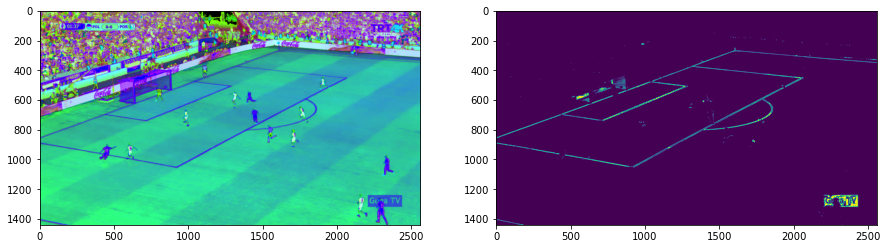

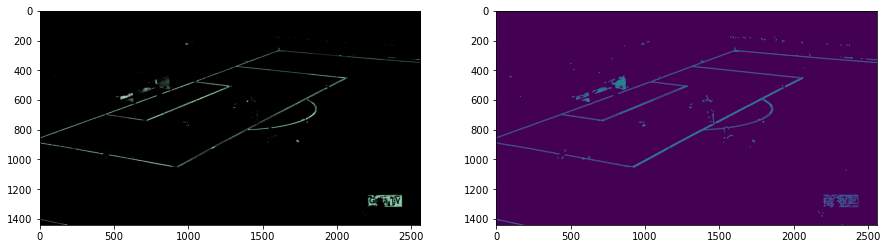

In [10]:
fig, axes = plt.subplots(figsize=(15, 10), ncols=2)
axes[0].imshow(hsv)
axes[1].imshow(mask)

fig, axes = plt.subplots(figsize=(15, 10), ncols=2)
axes[0].imshow(blur_green)
axes[1].imshow(edges)

##### 1.2. Searching for the vertical and horizontal vanishing points

In [24]:
def det(a, b):
    return a[0] * b[1] - a[1] * b[0]

def line_intersection(line1, line2):
    x_diff = (line1[0][0] - line1[1][0], line2[0][0] - line2[1][0])
    y_diff = (line1[0][1] - line1[1][1], line2[0][1] - line2[1][1])

    div = det(x_diff, y_diff)
    if div == 0:
        return None

    d = (det(*line1), det(*line2))
    x = det(d, x_diff) / div
    y = det(d, y_diff) / div

    return [x, y]

def find_intersections(lines):
    intersections = []
    for i, line_1 in enumerate(lines):
        for line_2 in lines[i + 1:]:
            if not line_1 == line_2:
                intersection = line_intersection(line_1, line_2)
                if intersection:
                    intersections.append(intersection)

    return intersections

In [37]:
def find_vanishing(image, orientation):
    print('\n -> 1. calculate vanishing point')    
    
    if rotation == True:
        image = cv2.flip(image,1)

    lines = cv2.HoughLines(edges, rho=1, theta=np.pi/180, threshold=200, min_theta=np.pi/36, max_theta=np.pi-np.pi/36)
    
    rLimit = 100
    selectedLines = []
    selectedLinesParams = []

    for line in lines: 
        rho,theta = line[0]

        if orientation == 'vertical':
            if abs(theta-np.pi/90) > np.pi/2:
                continue
        elif orientation == 'horizontal':
            if abs(theta-np.pi/90) < np.pi/2:
                continue
                
        a = np.cos(theta) 
        b = np.sin(theta)
        x0 = a*rho 
        y0 = b*rho 
        x1 = int(x0 + 10000*(-b)) 
        y1 = int(y0 + 10000*(a)) 
        x2 = int(x0 - 10000*(-b)) 
        y2 = int(y0 - 10000*(a))

        isLineValid = True
        if len(selectedLines) > 0: 
            for lineParams in selectedLinesParams:
                if abs(lineParams[0] - rho) < rLimit:
                    isLineValid = False
            for selectedLine in selectedLines:
                if not line_intersection(selectedLine, [[x1,y1],[x2,y2]]):
                    isLineValid = False
            if [[x1,y1],[x2,y2]] in selectedLines or [[x2,y2],[x1,y1]] in selectedLines:
                isLineValid = False

        if isLineValid:
            selectedLines.append([[x1,y1],[x2,y2]])
            selectedLinesParams.append([rho, theta])
            img_lines = cv2.line(image, (x1,y1), (x2,y2), (0,0,0), thickness = 3)

            intersectionPoints = find_intersections(selectedLines)
            vanishingPointX = 0.0
            vanishingPointY = 0.0
            for point in intersectionPoints:
                vanishingPointX += point[0]
                vanishingPointY += point[1]
                
    vanishingPoint = (int(vanishingPointX/len(intersectionPoints)), int(vanishingPointY/len(intersectionPoints)))            

    print("Vanishing point coordinates : {}".format(vanishingPoint))
    
    img_lines_rgb = cv2.cvtColor(img_lines, cv2.COLOR_BGR2RGB)
    return vanishingPoint, img_lines_rgb


In [38]:
vertical_vanishingPoint, result_vertical = find_vanishing(img_temp, 'vertical')
img_temp = image.copy()


 -> 1. calculate vanishing point
Vanishing point coordinates : (4423, -760)


In [39]:
horizontal_vanishingPoint, result_horizontal = find_vanishing(img_temp, 'horizontal')
img_temp = image.copy()


 -> 1. calculate vanishing point
Vanishing point coordinates : (-7688, -571)


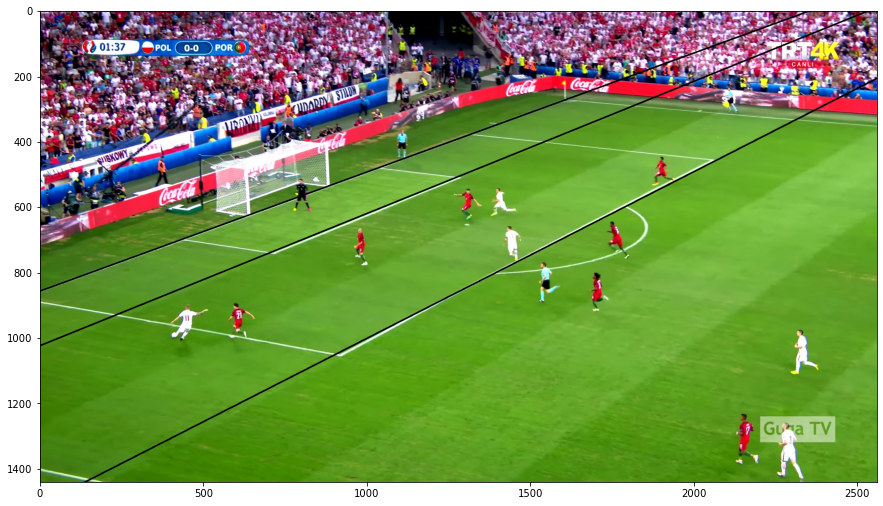

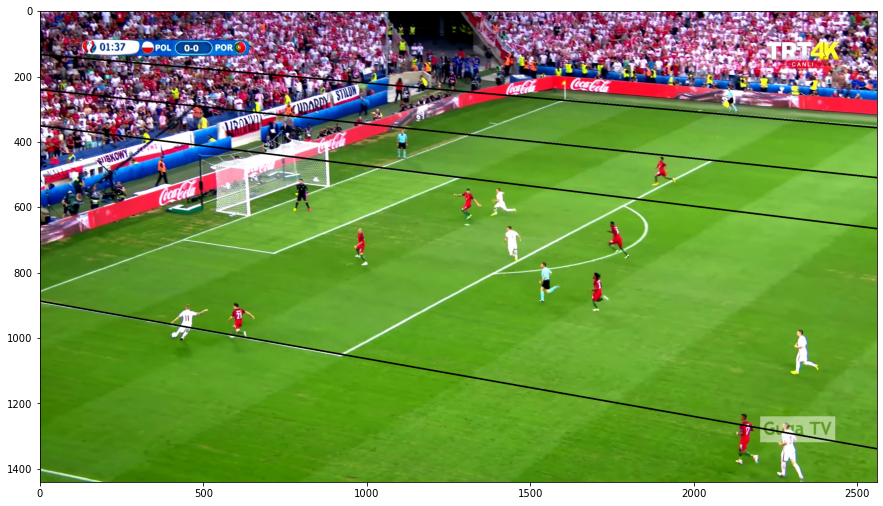

In [40]:
fig, axes = plt.subplots(figsize=(15, 10))
axes.imshow(result_vertical)

fig, axes = plt.subplots(figsize=(15, 10))
axes.imshow(result_horizontal)

# 2. Team classification

Team classification is the task of determining the team that each player belongs to.
The team of each player is identified based on the features extracted from the colour of their shirt and their shorts.

This region of interest for each player is used to extract the features for determining the team for the player. All the pixels on and inside the rectangle are considered.

The aim of this particular task is just to assign a team to each player, but we don't identify referees and goal keepers. As the referees are to be excluded from the downstream tasks, and the keepers are to be treated separately in the core offside algorithm, it should be an axe of research for further and future works.

Also, instead of using the prior knowledge of the teams colors (white for Poland and red for Portugal), it could be a better approach to use clustering methods, like DBSCAN or KMeans algorithms

In [43]:
### Prior knowledge
### Global variables

#red range
lower_red = np.array([125,130,45])
upper_red = np.array([180,255,255])

#white range
lower_white = np.array([0,0,0])
upper_white = np.array([0,0,255])

stride_aud = (75,75)
stride_kernel = (25,25)
stride_close = (150,150)

# stride_aud = (100,100)
# stride_kernel = (10,10)
# stride_close = (150,150)

kernel_aud = np.ones(stride_aud,np.uint8)
kernel = np.ones(stride_kernel,np.uint8)
kernel_close = np.ones(stride_close,np.uint8)

##### 2.1. Apply contouring methods on the image to detect players

In [47]:
def preprocessing_classification(image):
    print('\n -> 2. applying contours on the image')
    
    if rotation == True:
        image = cv2.flip(image,1)
    
    img_temp = image.copy()

    hsv = cv2.cvtColor(img_temp, cv2.COLOR_BGR2HSV)
    mask = cv2.inRange(hsv, (35, 0, 0), (65, 255,255))
    mask = 255 - mask

    thresh_aud = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel_aud)
    thresh_aud = cv2.morphologyEx(thresh_aud, cv2.MORPH_OPEN, kernel_close)
    thresh_aud = 255 - thresh_aud

    thresh_players = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)
    thresh = cv2.bitwise_and(thresh_aud , thresh_players)

    contours,_ = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    img_cont = cv2.drawContours(img_temp, contours, -1, (0,255,0), 3)
    
    img_cont_rgb = cv2.cvtColor(img_cont, cv2.COLOR_BGR2RGB)
    return img_cont_rgb, contours

In [48]:
img_cont, contours = preprocessing_classification(img_temp)


 -> 2. applying contours on the image


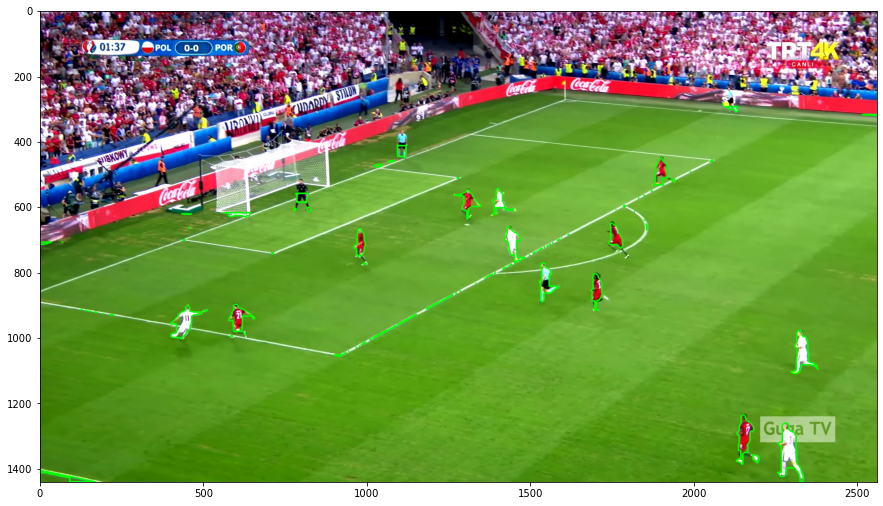

In [49]:
fig, axes = plt.subplots(figsize=(15, 10))
axes.imshow(img_cont)

##### 2.2. Classifying players according to their jerseys color and action on the pitch

In [58]:
def detecting_players(image, team_color, attack, threshold=100):
    
    if rotation == True:
        image = cv2.flip(image,1)

    img_detect = np.copy(img_cont)
    
    if attack==True:
        print('\n -> 3. detecting attacking players on the pitch')
    else:
        print('\n -> 4. detecting defending players on the pitch')
    
    selectedLines = []
    n = 0
    for c in contours:
        x,y,w,h = cv2.boundingRect(c)

        #Detect players
        if(20<w<250 and 20<h<250):

            player_img = img_cont[y:y+h,x:x+w]
            player_hsv = cv2.cvtColor(player_img,cv2.COLOR_BGR2HSV)

            if team_color == "white":
                mask = cv2.inRange(player_hsv, lower_white, upper_white)
                color = (255,255,255)
            elif team_color == "red":
                mask = cv2.inRange(player_hsv, lower_red, upper_red)  
                color = (0,0,255)

            res = cv2.bitwise_and(player_img, player_img, mask=mask)
            res = cv2.cvtColor(res,cv2.COLOR_HSV2BGR)
            res = cv2.cvtColor(res,cv2.COLOR_BGR2GRAY)
            nzCount = cv2.countNonZero(res)

            font = cv2.FONT_HERSHEY_SIMPLEX

            if(nzCount >= threshold):
                if attack == True:
                    n += 1
                    imD = cv2.putText(image, 'Attack', (x-2, y-2), font, 0.8, color, 2, cv2.LINE_AA)
                    imD = cv2.rectangle(imD, (x,y), (x+w,y+h), color, 3)
                else:
                    n += 1
                    imD = cv2.putText(image, 'Defense', (x-2, y-2), font, 0.8, color, 2, cv2.LINE_AA)
                    imD = cv2.rectangle(imD, (x,y), (x+w,y+h), color, 3)
        
                    imD = cv2.line(image, (int(x+w/2),y+h), vertical_vanishingPoint, (255,0,0), thickness = 2)
                    selectedLines.append([[int(x+w/2),y+h],[vertical_vanishingPoint[0], vertical_vanishingPoint[1]]])  
                
                    imD = cv2.line(imD, (int(x+w/2),y+h), horizontal_vanishingPoint, (255,0,0), thickness = 2)
                    selectedLines.append([[0,0],[0, image.shape[0]]])

            else: pass
    print(n, "players")
    imD_rgb = cv2.cvtColor(imD, cv2.COLOR_BGR2RGB)
    return imD_rgb, selectedLines, n


In [59]:
img_attack,_,nb_att_plyr = detecting_players(img_temp, team_color="white", attack=True, threshold=100)
img_temp = image.copy()


 -> 3. detecting attacking players on the pitch
5 players


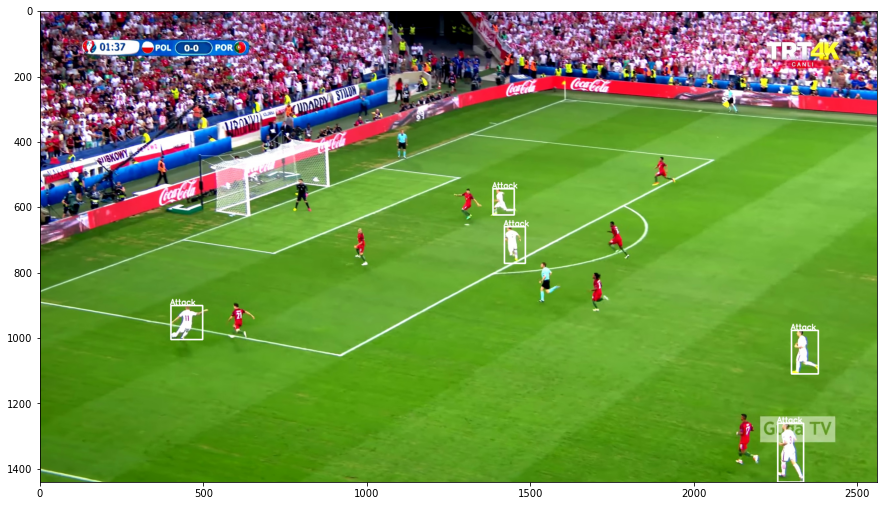

In [60]:
fig, axes = plt.subplots(figsize=(15, 10))
axes.imshow(img_attack)

In [61]:
img_defend, selectedLines, nb_def_plyr = detecting_players(img_temp, team_color="red", attack=False, threshold=100)
img_temp = image.copy()

assert len(selectedLines) == 2*nb_def_plyr


 -> 4. detecting defending players on the pitch
7 players


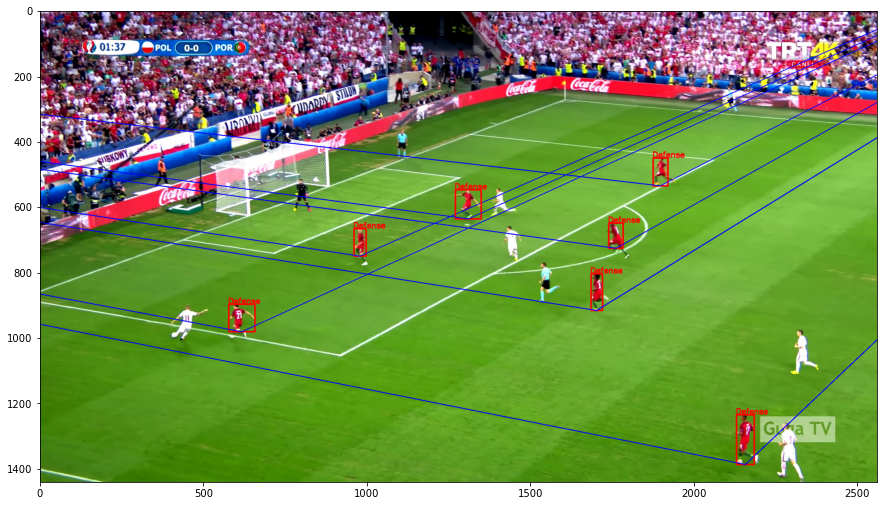

In [62]:
fig, axes = plt.subplots(figsize=(15, 10))
axes.imshow(img_defend)

# 3. Offside detection line

The first step is to find out the last defending player on the field. Attacking players that are positioned beyond the last defending player are termed as offside. 

This is what we wanted to do : the player of the defending team that forms the maximum angle with the vanishing points is considered to be the last defending player. This angle is then compared with the angles formed by the players of the attacking team with the vanishing points. The attacking players having angles greater than the last defending player are termed as offside.

Nevertheless, we did not suceed to perform the computation of the angles and as the deadline of the project was approaching, we did apply the plan B which consist in projecting the line from vertical vanishing point on the y-axis of the image and find the intersection with the lower value (regarding the orientation of the y-axis, if the origin of this axis was on the bottom left we had to take the maximum intersection point.)

In [63]:
### Prior knowledge
### Global variables

#blue lines range
lower_blue = np.array([114,200,200])
upper_blue = np.array([150,255,255])

##### 3.1. Extracting the lines of defensives players from the images

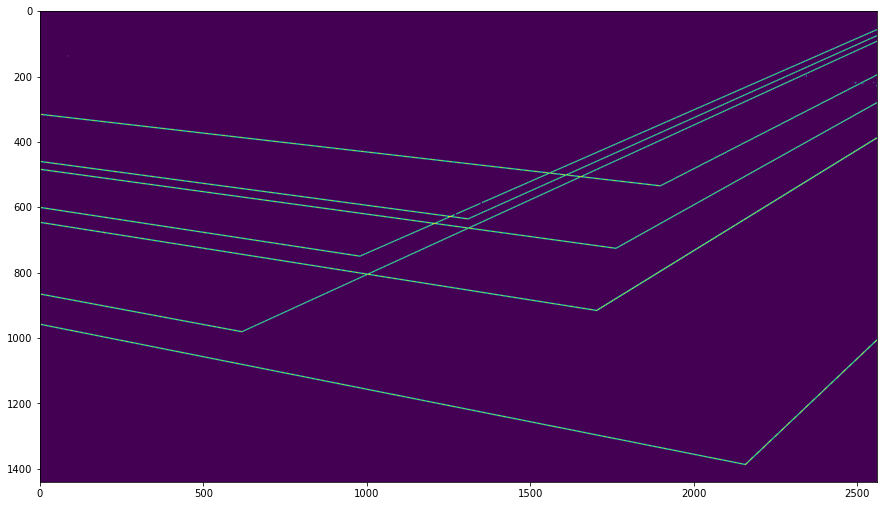

In [64]:
img_defend_temp = img_defend.copy()
img_defend_bgr = cv2.cvtColor(img_defend_temp, cv2.COLOR_RGB2BGR)
hsv_angle = cv2.cvtColor(img_defend_bgr, cv2.COLOR_BGR2HSV)
mask_angle = cv2.inRange(hsv_angle, lower_blue, upper_blue)

fig, axes = plt.subplots(figsize=(15, 10))
axes.imshow(mask_angle)

##### 3.2. Core offside algorithm

In [74]:
def offside_line_marker(image):
    mylist = []
    for i in range(0,len(selectedLines)+1,2):
        for j in range(1,len(selectedLines)+1,2):
            if j-i==1:

                line1, line2 = selectedLines[i], selectedLines[j]
                mylist.append(line_intersection(line1, line2))

    intersection_y = [mylist[i][1] for i in range(len(mylist))]
    min_value = min(intersection_y)
    min_index = intersection_y.index(min_value)
    x, y = selectedLines[2*min_index][0][0], selectedLines[2*min_index][0][1]

    print("\nThe player with the coordinates : ({},{}) is the last defensive player.".format(x, y))
    
    font = cv2.FONT_HERSHEY_SIMPLEX

    if rotation == True:
        image = cv2.flip(image,1)
        x, y = image.shape[1] - x, y
        imD = cv2.line(image, (0,int(min_value)), vertical_vanishingPoint, (0,0,0), thickness = 2)
        
        imD = cv2.flip(imD,1)
        imD = cv2.putText(imD, 'last player', (x-50, y-80), font, 0.8, (0,0,0), 2, cv2.LINE_AA)

    elif rotation == False:
        imD = cv2.putText(image, 'last player', (x-50, y-80), font, 0.8, (0,0,0), 2, cv2.LINE_AA)
        imD = cv2.line(imD, (0,int(min_value)), vertical_vanishingPoint, (0,0,0), thickness = 2)
        
    imD_rgb = cv2.cvtColor(imD, cv2.COLOR_BGR2RGB)
    
    return imD_rgb, x, y


The player with the coordinates : (978,749) is the last defensive player.


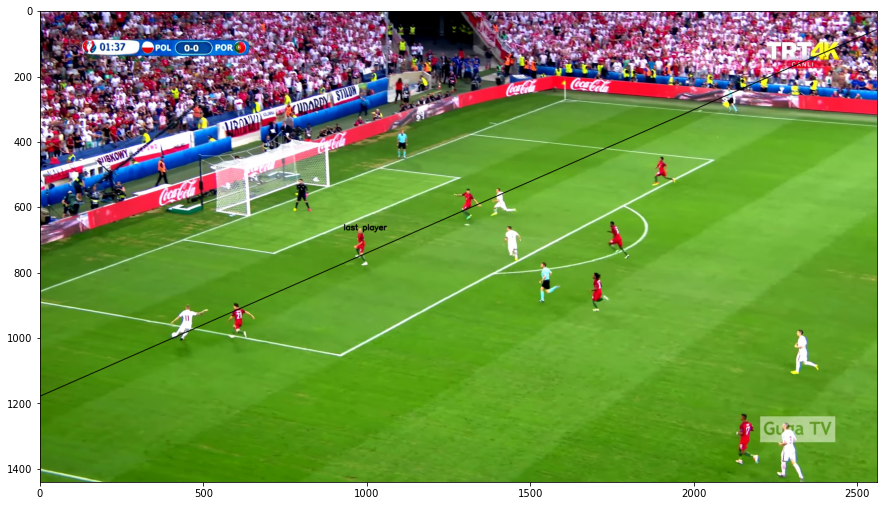

In [70]:
offside_res,x_last_def,y_last_def = offside_line_marker(img_temp)
img_temp = image.copy()

fig, axes = plt.subplots(figsize=(15, 10))
axes.imshow(offside_res)

##### 3.3. Evaluation

In [71]:
ground_truth = [
    [0, 7, 5, [981.0, 772.0]],
    [1, 7, 3, [1525.44, 590.0]],
    [2, 8, 6, [1018.0, 669.0]],
    [3, 8, 6, [1082.89, 746.0]],
    [4, 8, 6, [1473.78, 617.0]],
    [5, 9, 7, [1042.11, 711.0]],
    [6, 10, 8, [1215.44, 355.0]],
    [7, 9, 5, [939.0, 685.0]],
    [8, 9, 6, [1208.78, 684.0]],
    [9, 8, 6, [493.33, 678.0]],
    [10, 6, 4, [1574.78, 627.0]],
    [11, 9, 8, [1185.56, 427.0]],
    [12, 9, 5, [824.0, 651.0]],
    [13, 7, 5, [892.5, 759.0]],
    [14, 7, 3, [1386.62, 529.0]],
    [15, 7, 3, [1120.11, 773.0]],
    [16, 9, 7, [497.33, 915.0]],
    [17, 5, 7, [1614.0, 603.0]],
    [18, 9, 6, [491.56, 782.0]],
    [19, 7, 3, [1540.11, 675.0]]
]


The player with the coordinates : (978,749) is the last defensive player.


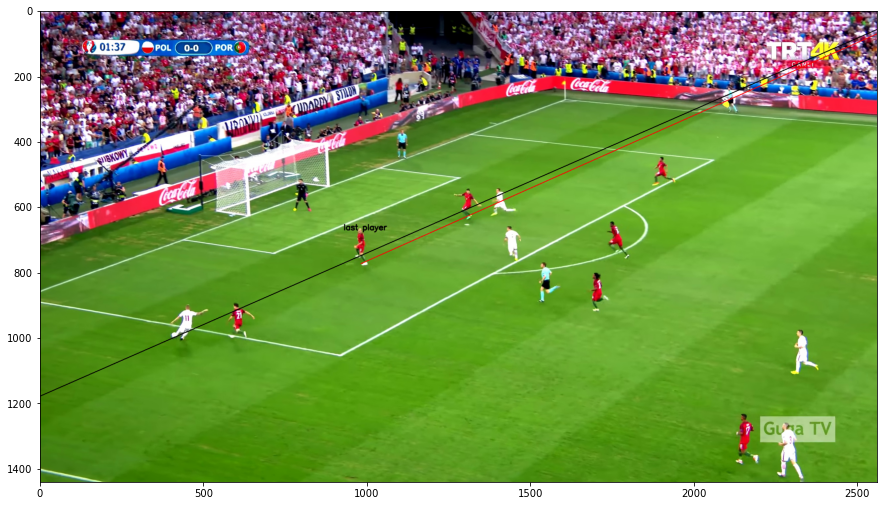

In [75]:
offside_res,x_last_def,y_last_def = offside_line_marker(img_temp)
offside_res = cv2.line(offside_res,(int(ground_truth[idx][3][0]),int(ground_truth[idx][3][1])) , vertical_vanishingPoint, (255,0,0), thickness = 2)
img_temp = image.copy()

prediction = [idx, nb_def_plyr, nb_att_plyr, [x_last_def,y_last_def]]

fig, axes = plt.subplots(figsize=(15, 10))
axes.imshow(offside_res)

In [68]:
# cv2.imwrite('./saves/offside_res.jpg', offside_res)

In [76]:
def F1_eval(image, idx):

    if prediction[0] == ground_truth[idx][0]:

        if prediction[1] >= ground_truth[idx][1]:
            TP_d = ground_truth[idx][1]
            FP_d = prediction[1] - ground_truth[idx][1]
            FN_d = 0
        elif prediction[1] <= ground_truth[idx][1]:
            TP_d = prediction[1]
            FP_d = 0
            FN_d = ground_truth[idx][1] - prediction[1] 

        if prediction[2] >= ground_truth[idx][2]:
            TP_a = ground_truth[idx][2]
            FP_a = prediction[2] - ground_truth[idx][2]
            FN_a = 0
        elif prediction[2] <= ground_truth[idx][2]:
            TP_a = prediction[2]
            FP_a = 0
            FN_a = ground_truth[idx][2] - prediction[2] 

        precision_a = TP_a / (TP_a + FP_a)
        precision_d = TP_d / (TP_d + FP_d)

        recall_a = TP_a / (TP_a + FN_a)
        recall_d = TP_d / (TP_d + FN_d)

        F1_a = 2*precision_a *recall_a / (precision_a + recall_a)
        F1_d = 2*precision_d *recall_d / (precision_d + recall_d)

    return F1_a, F1_d
            

def eval_offside(image, idx):

    if prediction[0] == ground_truth[idx][0]:
        
        gtLines = []
        gtLines.append([[int(ground_truth[idx][3][0]),int(ground_truth[idx][3][1])],[vertical_vanishingPoint[0], vertical_vanishingPoint[1]]]) 
        gtLines.append([[0,0],[0, image.shape[0]]])

        line1, line2 = gtLines[0], gtLines[1]
        line3, line2 = [[x_last_def,y_last_def],[vertical_vanishingPoint[0], vertical_vanishingPoint[1]]], gtLines[1]

        error = abs(line_intersection(line1, line2)[1] - line_intersection(line3, line2)[1]) / image.shape[0] *100

    return error

In [77]:
F1_a, F1_d = F1_eval(offside_res, idx)
error = eval_offside(offside_res, idx)
print(f'{fileNames[file_itr]} :    F1_Attack:  {F1_a :.2%}    F1_Defense:  {F1_d :.2%}    Offside_error:  {error :.2f}%')

data/images/0.jpg :    F1_Attack:  100.00%    F1_Defense:  100.00%    Offside_error:  2.17%


# 4. Another example

This is an example for which the orientation of the goal is different so we set the variable rotation to False.
Here the offside detection is not working and the horizontal lines computed with the horizontal vanishing point would not allow us to apply the angles methos for the detection of the offside line. 

In [29]:
idx = 25

for file_itr in range(idx,len(fileNames)):
    print('\nImage selected :')
    print(fileNames[file_itr])
    
    image = cv2.imread(fileNames[file_itr])
    
    break
    
img_temp2 = image.copy()


Image selected :
data/images/414.jpg


In [30]:
imS = cv2.resize(img_temp2, (960, 540)) 
img_hsv = cv2.cvtColor(imS, cv2.COLOR_BGR2HSV)

### initial setup:
invert = False
screen = "Control"
col = [[0,0,0],[179,255,255]]
cv2.namedWindow(screen, cv2.WINDOW_AUTOSIZE)

# cv2.imshow('Image selected', imS)
createGUI()

cv2.waitKey(0)
cv2.destroyAllWindows()

In [31]:
### Global variables
low_hue  = col[0][0]
high_hue = col[1][0]
low_sat  = col[0][1]
high_sat = col[1][1]
low_val  = col[0][2]
high_val = col[1][2]

print('Low Hue :', low_hue)
print('High Hue :', high_hue)
print('Low Saturation :', low_sat)
print('High Saturation :', high_sat)
print('Low Value :', low_val)
print('High Value :', high_val)

# To change accordingly to the position of the goal on the image :
# - if the goal is on the right of the image : rotation = True
# - if the goal is on the left of the image : rotation = False
rotation=True

Low Hue : 45
High Hue : 65
Low Saturation : 54
High Saturation : 141
Low Value : 165
High Value : 255


In [32]:
hsv, mask, blur_green, edges = preprocessing(img_temp2)

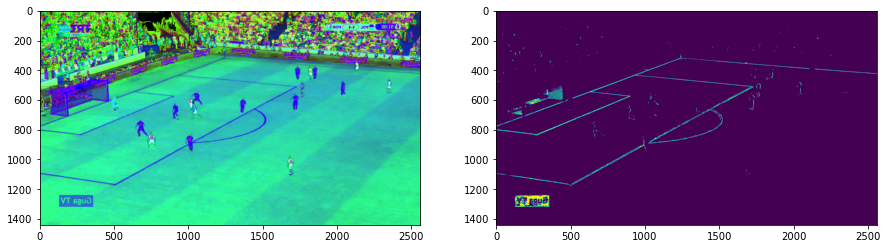

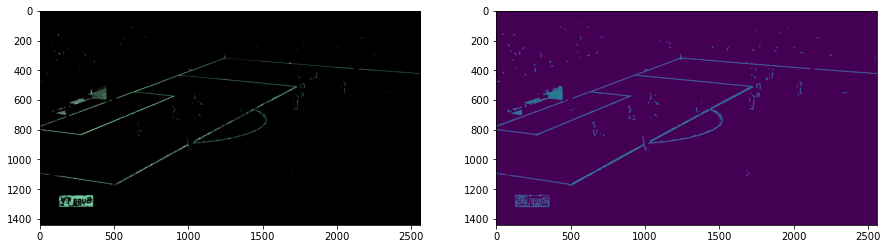

In [33]:
fig, axes = plt.subplots(figsize=(15, 10), ncols=2)
axes[0].imshow(hsv)
axes[1].imshow(mask)

fig, axes = plt.subplots(figsize=(15, 10), ncols=2)
axes[0].imshow(blur_green)
axes[1].imshow(edges)

In [34]:
vertical_vanishingPoint, result_vertical = find_vanishing(img_temp2, 'vertical')
img_temp2 = image.copy()


 -> 1. calculate vanishing point
Vanishing point coordinates : (3950, -657)


In [35]:
horizontal_vanishingPoint, result_horizontal = find_vanishing(img_temp2, 'horizontal')
img_temp2 = image.copy()


 -> 1. calculate vanishing point
Vanishing point coordinates : (433379, 45953)


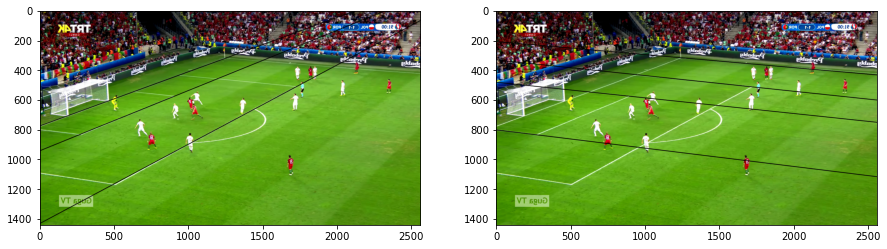

In [36]:
fig, axes = plt.subplots(figsize=(15, 10), ncols=2)
axes[0].imshow(result_vertical)
axes[1].imshow(result_horizontal)

In [37]:
stride_aud = (75,75)
stride_kernel = (25,25)
stride_close = (150,150)

kernel_aud = np.ones(stride_aud,np.uint8)
kernel = np.ones(stride_kernel,np.uint8)
kernel_close = np.ones(stride_close,np.uint8)


 -> 2. applying contours on the image


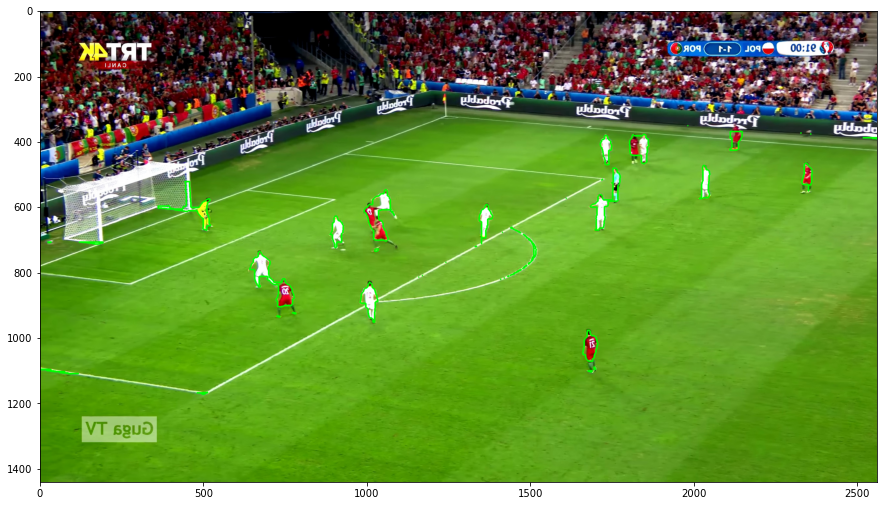

In [38]:
img_cont, contours = preprocessing_classification(img_temp2, 0)

fig, axes = plt.subplots(figsize=(15, 10))
axes.imshow(img_cont)

 -> 3. detecting attacking players on the pitch
6 players


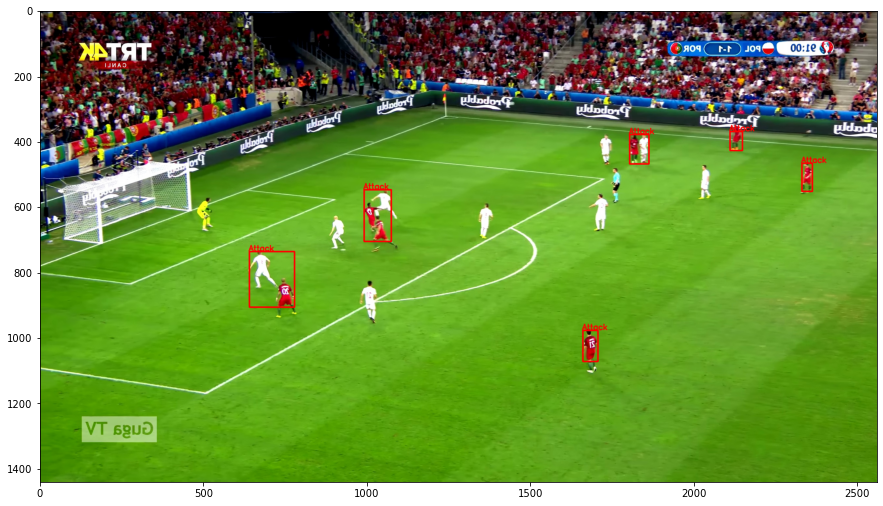

In [39]:
img_attack,_,nb_att_plyr = detecting_players(img_temp2, team_color="red", attack=True, threshold=50)
img_temp2 = image.copy()

fig, axes = plt.subplots(figsize=(15, 10))
axes.imshow(img_attack)

 -> 4. detecting defending players on the pitch
8 players


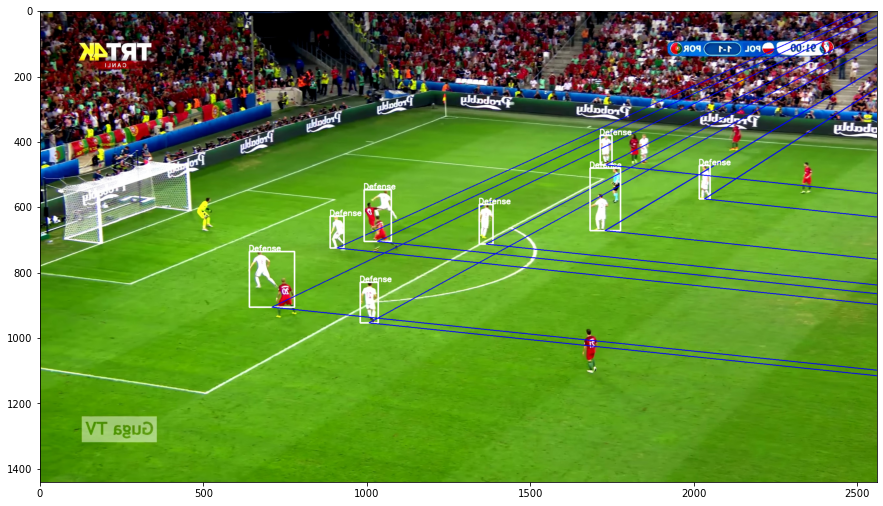

In [40]:
img_defend, selectedLines, nb_def_plyr = detecting_players(img_temp2, team_color="white", attack=False, threshold=100)
img_temp2 = image.copy()

assert len(selectedLines) == 2*nb_def_plyr

fig, axes = plt.subplots(figsize=(15, 10))
axes.imshow(img_defend)

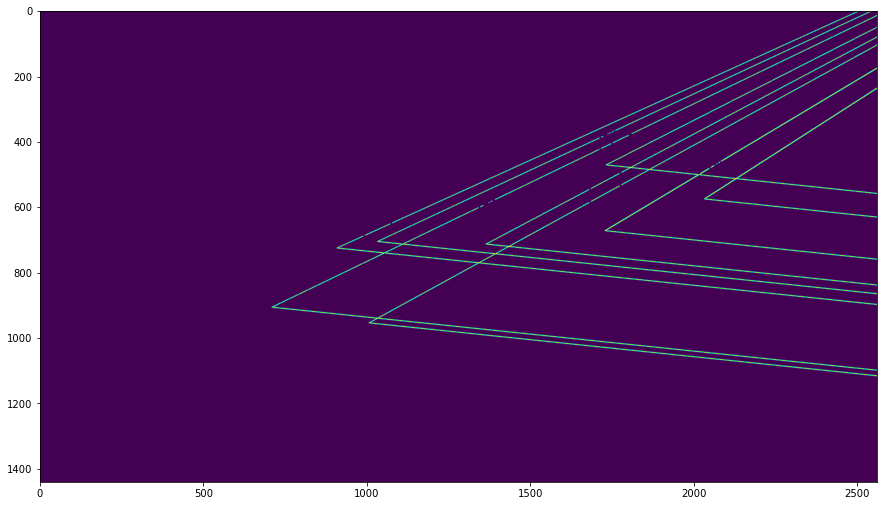

In [41]:
img_defend_temp = img_defend.copy()
img_defend_bgr = cv2.cvtColor(img_defend_temp, cv2.COLOR_RGB2BGR)
hsv_angle = cv2.cvtColor(img_defend_bgr, cv2.COLOR_BGR2HSV)
mask_angle = cv2.inRange(hsv_angle, lower_blue, upper_blue)

fig, axes = plt.subplots(figsize=(15, 10))
axes.imshow(mask_angle)


The player with the coordinates : (908,724) is the last defensive player.


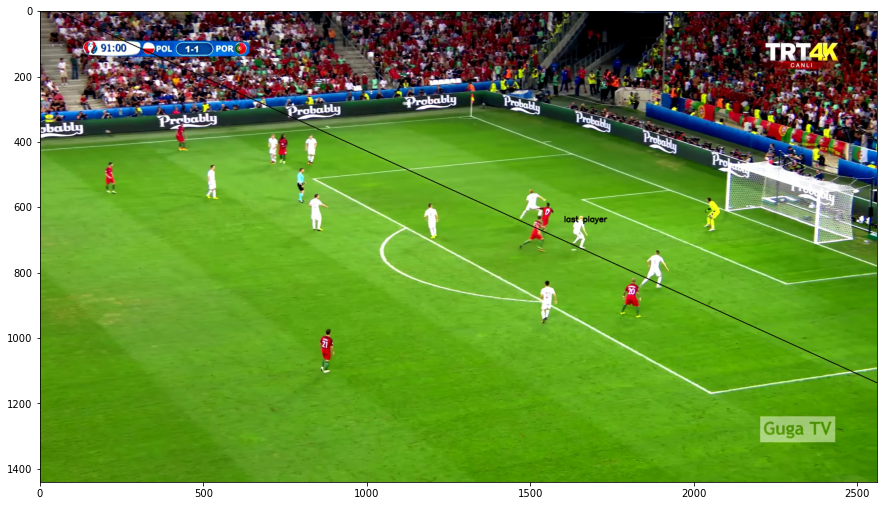

In [42]:
offside_res = offside_line_marker(img_temp2)
img_temp = image.copy()

fig, axes = plt.subplots(figsize=(15, 10))
axes.imshow(offside_res)